# Import Tools

In [1]:
import os
import json
import cv2
import numpy as np
import pandas as pd
from IPython.display import Image
import matplotlib.pyplot as plt
import torch
HOME = os.getcwd()
print(HOME)
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

C:\Users\USER\Downloads\DeepFashion2


In [2]:
!pip install -q ultralytics supervision --upgrade supervision
from ultralytics import YOLO
import supervision as sv

In [3]:
DATA_PATH = f"{HOME}/yolov9/deepfashion2-m-11k-1"
IMAGE_PATH = f"{HOME}/yolov9/deepfashion2-m-11k-1/train/images"
WEIGHT_PATH = f"{HOME}/yolov9/weights/yolov9c.pt"
# SINGLE_IMAGE = IMAGE_PATH + "/000001_png.rf.3efc63de2fe2bab8882abc87437bf048.jpg"
SINGLE_IMAGE = "yolov9/mytest/5.jpeg"
SAM_WEIGHT = f"{HOME}/fastsam/weights/FastSAM-s.pt"

# Get the model

In [4]:
# model = YOLO(WEIGHT_PATH)
# model.info()

In [5]:
model = YOLO(f"{HOME}/runs/detect/train18/weights/best.pt")
model.info()

YOLOv9c summary: 618 layers, 25539255 parameters, 0 gradients, 103.7 GFLOPs


(618, 25539255, 0, 103.73452800000001)

In [6]:
pp_model = YOLO("yolov9/weights/yolov9c.pt")
pp_model.info()

YOLOv9c summary: 618 layers, 25590912 parameters, 0 gradients, 104.0 GFLOPs


(618, 25590912, 0, 104.02268160000003)

In [7]:
# model.val(data=DATA_PATH+"/data.yaml",imgsz=480,batch=16,conf=0.25,iou=0.6,device='0')

# Get the data

In [8]:
# rf = Roboflow(api_key="grBnAXmaVyCZOXlCtfQ7")
# project = rf.workspace("bmstu-lvj0c").project("deepfashion2-m-11k")
# version = project.version(1)
# dataset = version.download("yolov9")

In [9]:
# Image(filename=f"{HOME}/yolov9/runs/detect/exp/000001_png.rf.3efc63de2fe2bab8882abc87437bf048.jpg", width=600)

# Model Training

In [10]:
# results = model.train(data=f'{DATA_PATH}/data.yaml', epochs=1000, imgsz=480)

# Inference

In [11]:
test = [f"yolov9/mytest/{file}" for file in os.listdir("yolov9/mytest")]
test

['yolov9/mytest/1.jpg',
 'yolov9/mytest/10.jpg',
 'yolov9/mytest/10484263.webp',
 'yolov9/mytest/11.jpg',
 'yolov9/mytest/12.jpg',
 'yolov9/mytest/13.jpg',
 'yolov9/mytest/14.jpg',
 'yolov9/mytest/15.jpg',
 'yolov9/mytest/16.jpg',
 'yolov9/mytest/17.jpg',
 'yolov9/mytest/18.jpg',
 'yolov9/mytest/19.jpg',
 'yolov9/mytest/2.jpg',
 'yolov9/mytest/3.jpg',
 'yolov9/mytest/4.jpg',
 'yolov9/mytest/5.jpeg',
 'yolov9/mytest/6.jpeg',
 'yolov9/mytest/6.jpg',
 'yolov9/mytest/7.jpg',
 'yolov9/mytest/8.webp',
 'yolov9/mytest/9.jpg',
 'yolov9/mytest/9.webp']

In [12]:
results = model(test, imgsz=480)


0: 480x480 2 long sleeve outwears, 1 trousers, 14.1ms
1: 480x480 2 long sleeve outwears, 2 long sleeve tops, 6 short sleeve tops, 6 shortss, 7 trouserss, 14.1ms
2: 480x480 1 skirt, 1 vest dress, 14.1ms
3: 480x480 1 long sleeve outwear, 1 short sleeve top, 1 skirt, 1 trousers, 14.1ms
4: 480x480 3 long sleeve outwears, 1 long sleeve top, 6 trouserss, 14.1ms
5: 480x480 2 short sleeve dresss, 1 short sleeve top, 1 shorts, 14.1ms
6: 480x480 1 long sleeve outwear, 2 short sleeve tops, 1 shorts, 3 trouserss, 1 vest dress, 14.1ms
7: 480x480 (no detections), 14.1ms
8: 480x480 (no detections), 14.1ms
9: 480x480 (no detections), 14.1ms
10: 480x480 (no detections), 14.1ms
11: 480x480 1 short sleeve top, 14.1ms
12: 480x480 1 short sleeve top, 1 trousers, 14.1ms
13: 480x480 1 trousers, 1 vest, 14.1ms
14: 480x480 (no detections), 14.1ms
15: 480x480 4 long sleeve outwears, 2 long sleeve tops, 2 short sleeve tops, 7 trouserss, 14.1ms
16: 480x480 1 long sleeve outwear, 4 trouserss, 14.1ms
17: 480x480 (

In [13]:
pp_results = pp_model(test, imgsz=480)
pp_results


0: 480x480 1 person, 9.5ms
1: 480x480 20 persons, 1 backpack, 4 handbags, 9.5ms
2: 480x480 1 person, 1 sports ball, 9.5ms
3: 480x480 8 persons, 2 bicycles, 12 cars, 11 traffic lights, 2 handbags, 1 tie, 9.5ms
4: 480x480 12 persons, 1 truck, 1 traffic light, 1 backpack, 4 handbags, 1 suitcase, 1 clock, 9.5ms
5: 480x480 13 persons, 6 cars, 2 buss, 2 traffic lights, 1 backpack, 6 handbags, 1 suitcase, 9.5ms
6: 480x480 13 persons, 4 cars, 1 handbag, 1 tie, 9.5ms
7: 480x480 12 persons, 4 backpacks, 2 handbags, 9.5ms
8: 480x480 1 person, 9.5ms
9: 480x480 9 persons, 1 car, 1 bus, 9.5ms
10: 480x480 31 persons, 1 bicycle, 1 handbag, 9.5ms
11: 480x480 17 persons, 9.5ms
12: 480x480 1 person, 9.5ms
13: 480x480 1 person, 9.5ms
14: 480x480 1 person, 2 books, 9.5ms
15: 480x480 11 persons, 1 truck, 1 traffic light, 3 handbags, 9.5ms
16: 480x480 12 persons, 2 bicycles, 1 car, 1 bus, 1 truck, 3 backpacks, 2 handbags, 9.5ms
17: 480x480 12 persons, 9.5ms
18: 480x480 8 persons, 1 tie, 9.5ms
19: 480x480 23

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

# SAM

In [14]:
# !pip install -q git+https://github.com/facebookresearch/segment-anything.git
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
CHECKPOINT_PATH = f"{HOME}/yolov9/weights/sam_vit_b_01ec64.pth"
# CHECKPOINT_PATH = f"{HOME}/yolov9/weights/sam_vit_b_01ec64.pth"

# MODEL_TYPE = "vit_h"
MODEL_TYPE = "vit_b"

In [15]:
sv.Color

supervision.draw.color.Color

In [16]:
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)
mask_predictor = SamPredictor(sam)

box_annotator = sv.BoundingBoxAnnotator(color=sv.Color.YELLOW, color_lookup = sv.ColorLookup.INDEX)
mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
label_annotator = sv.LabelAnnotator(text_position=sv.Position.CENTER, color_lookup = sv.ColorLookup.INDEX)
corner_annotator = sv.BoxCornerAnnotator(color=sv.Color.GREEN)

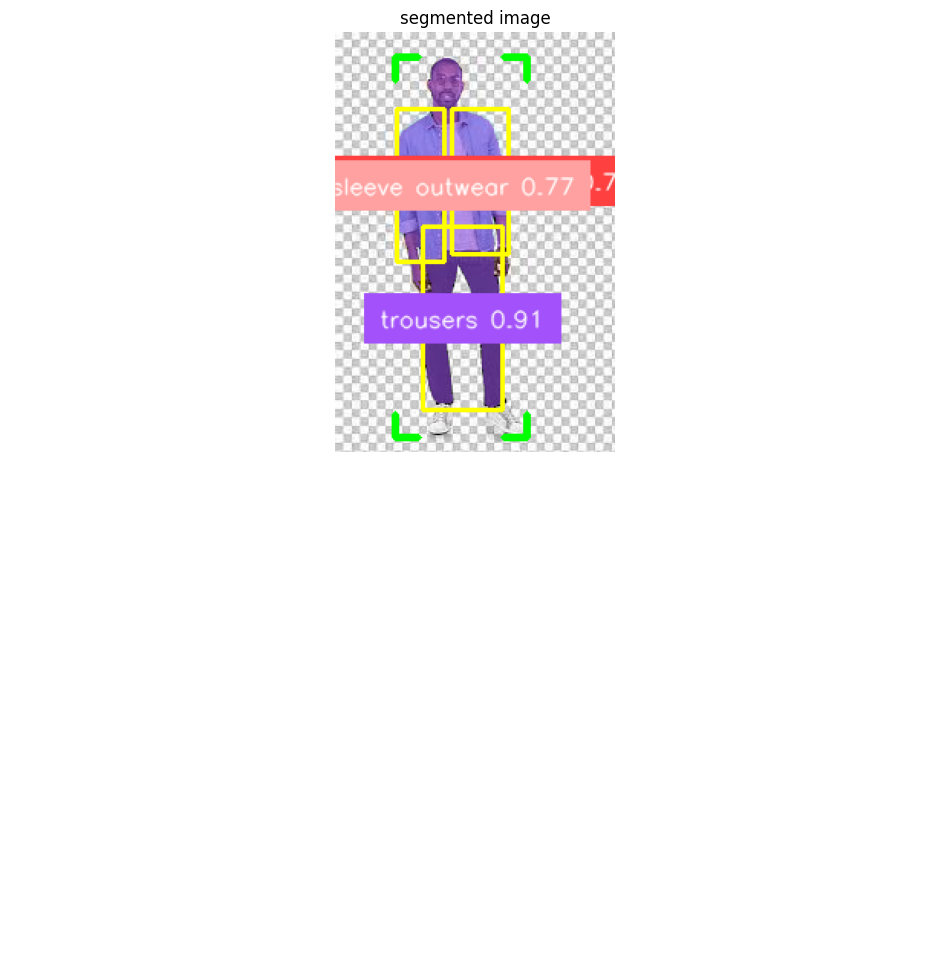

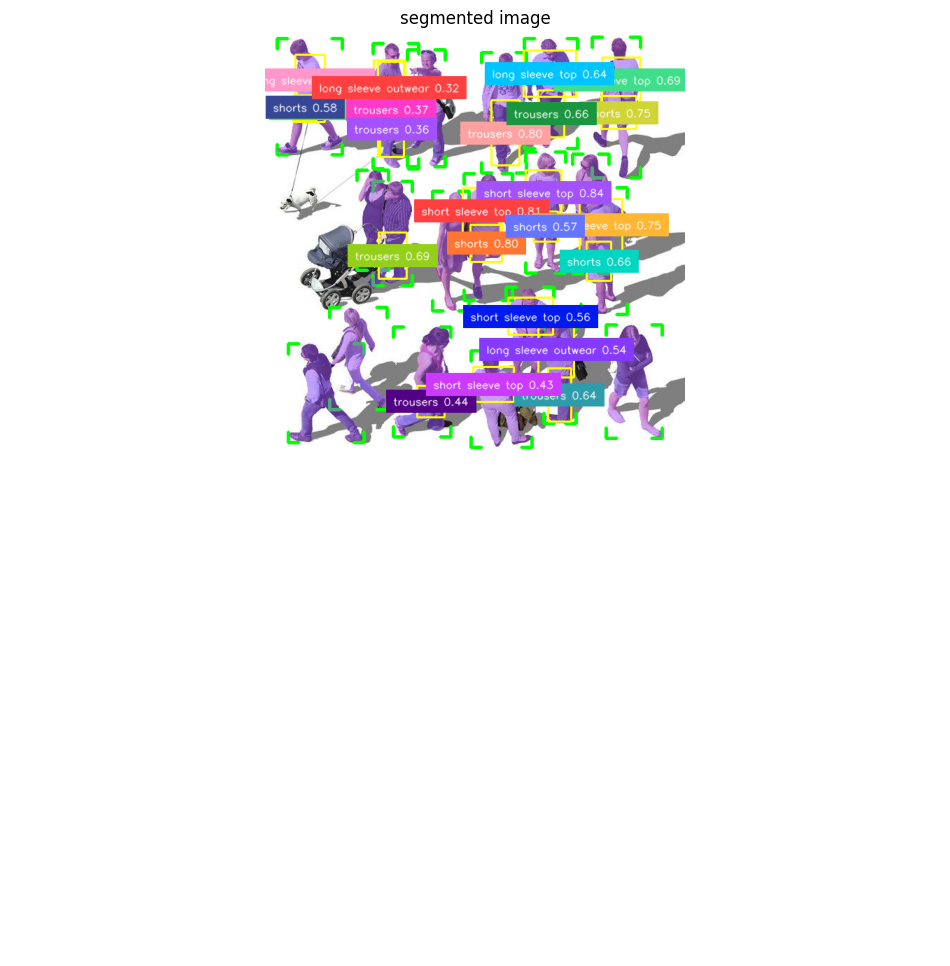

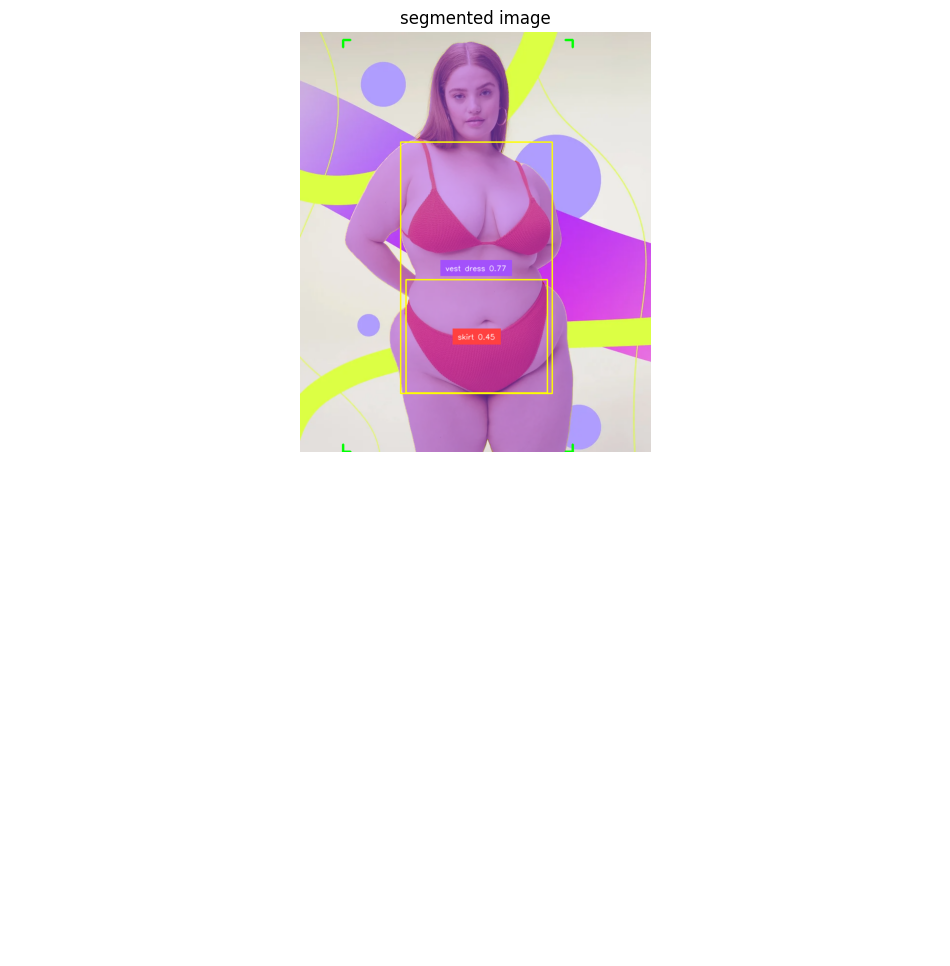

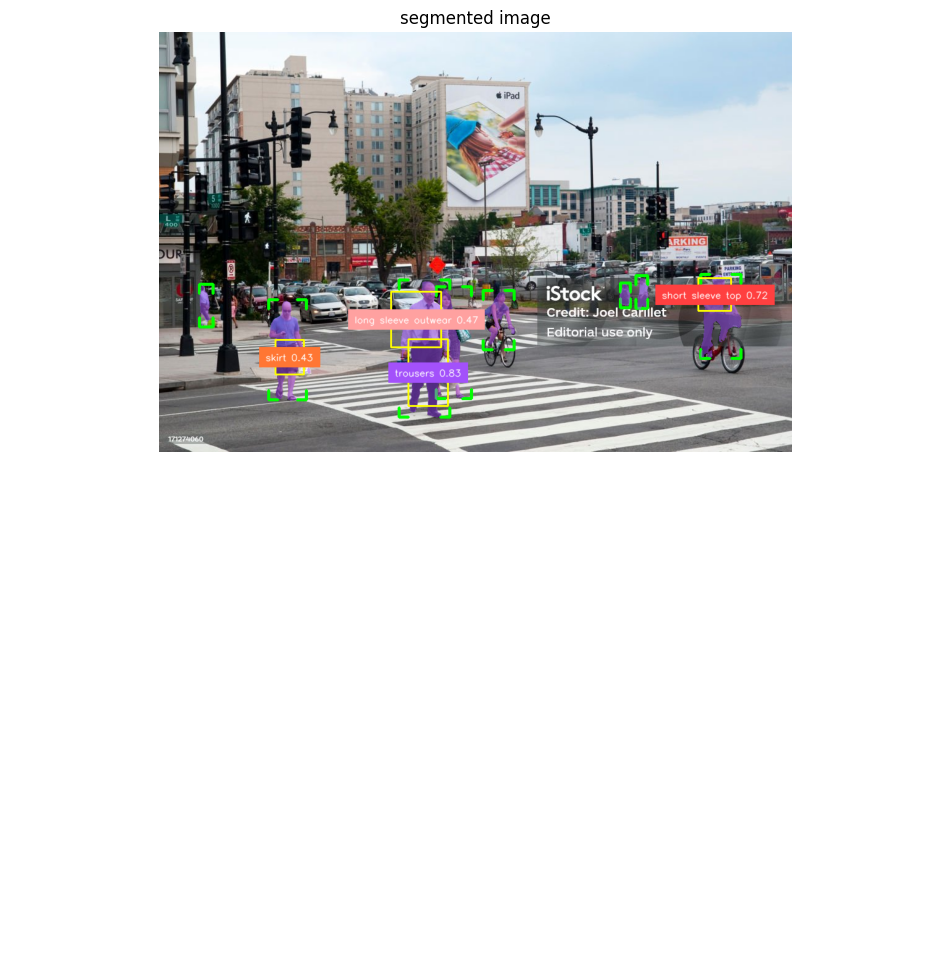

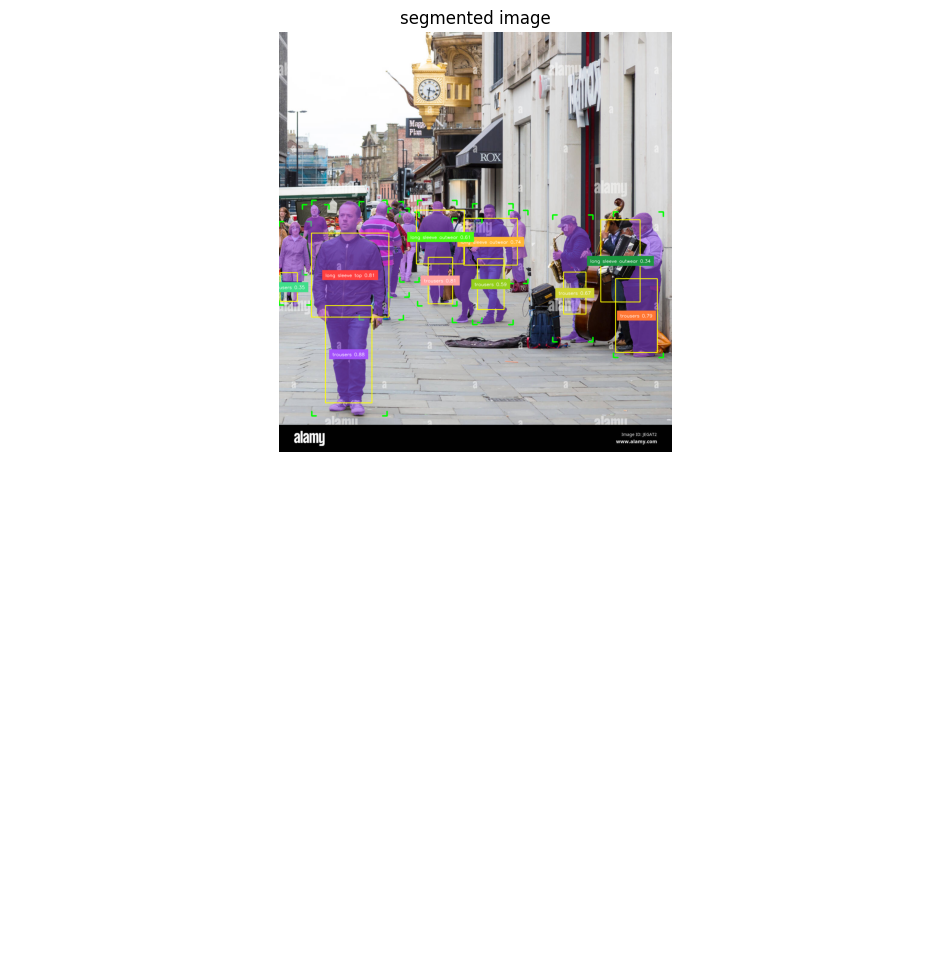

...

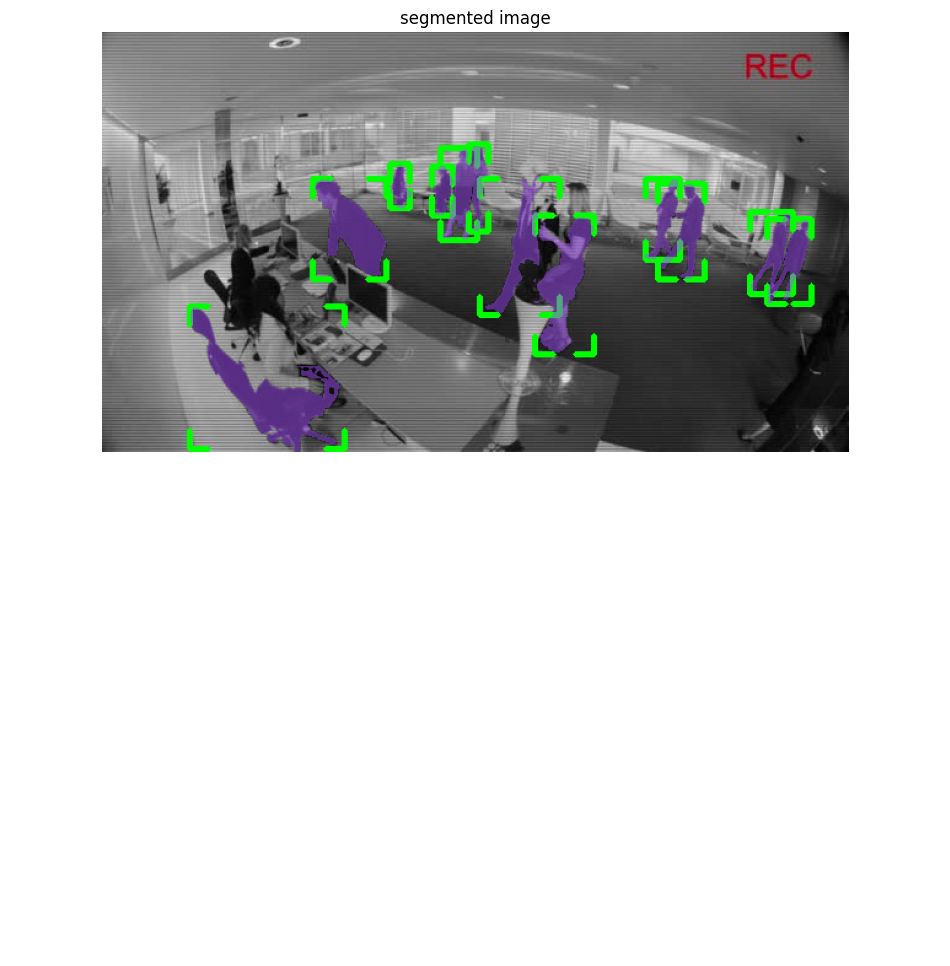

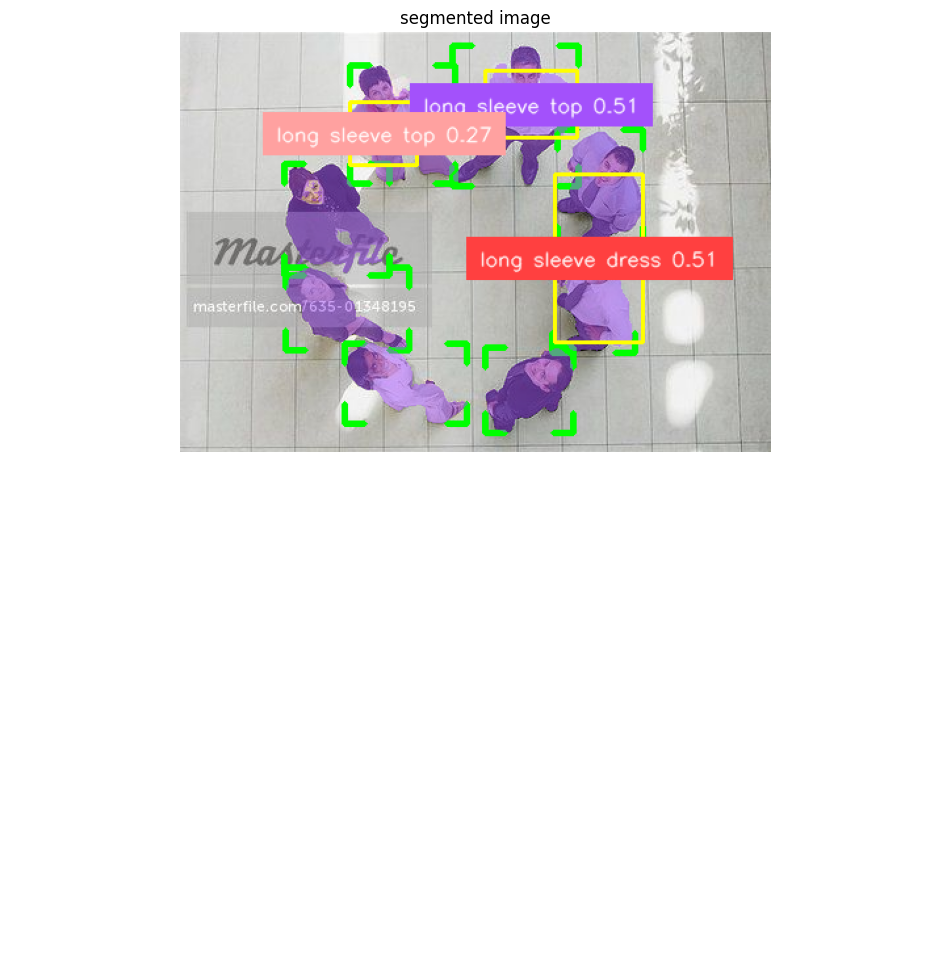

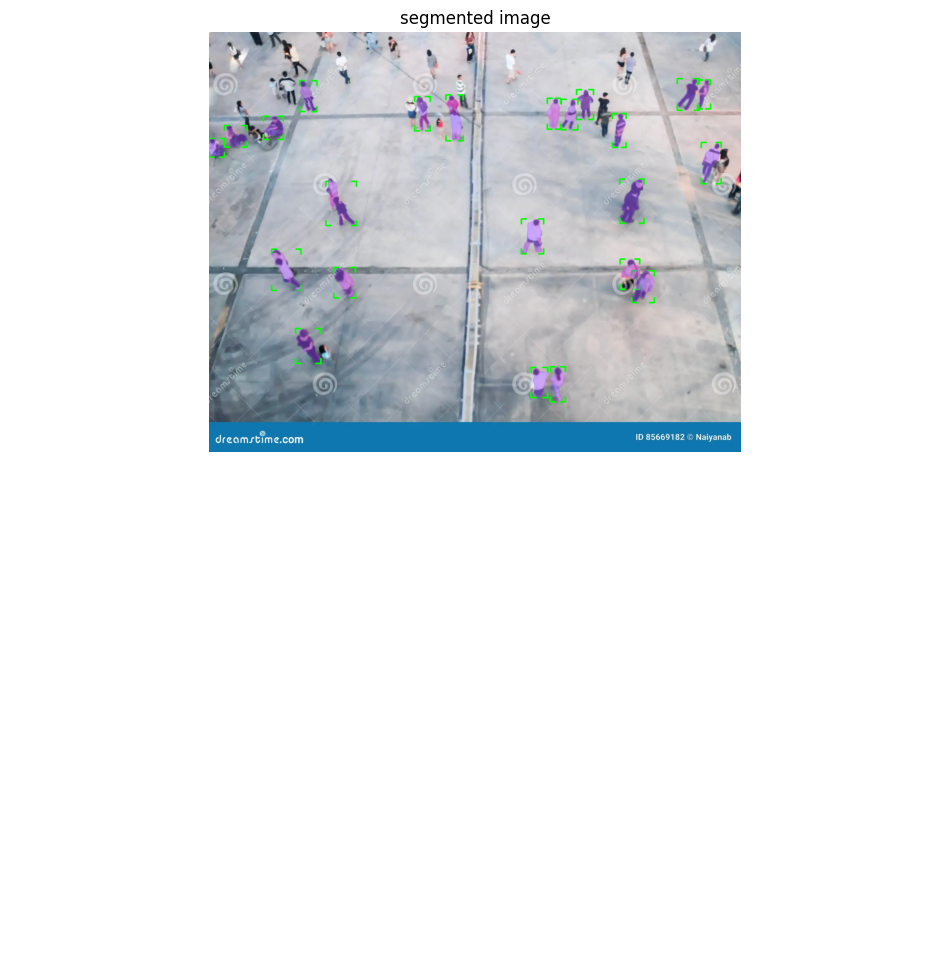

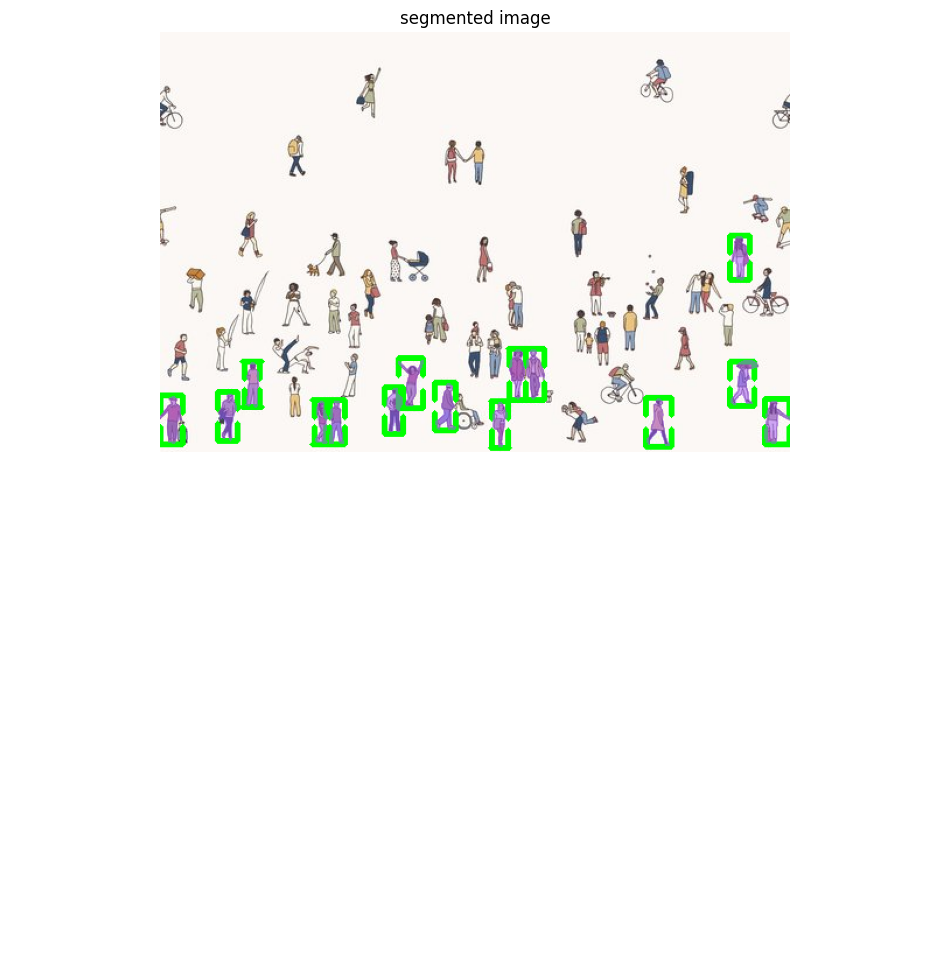

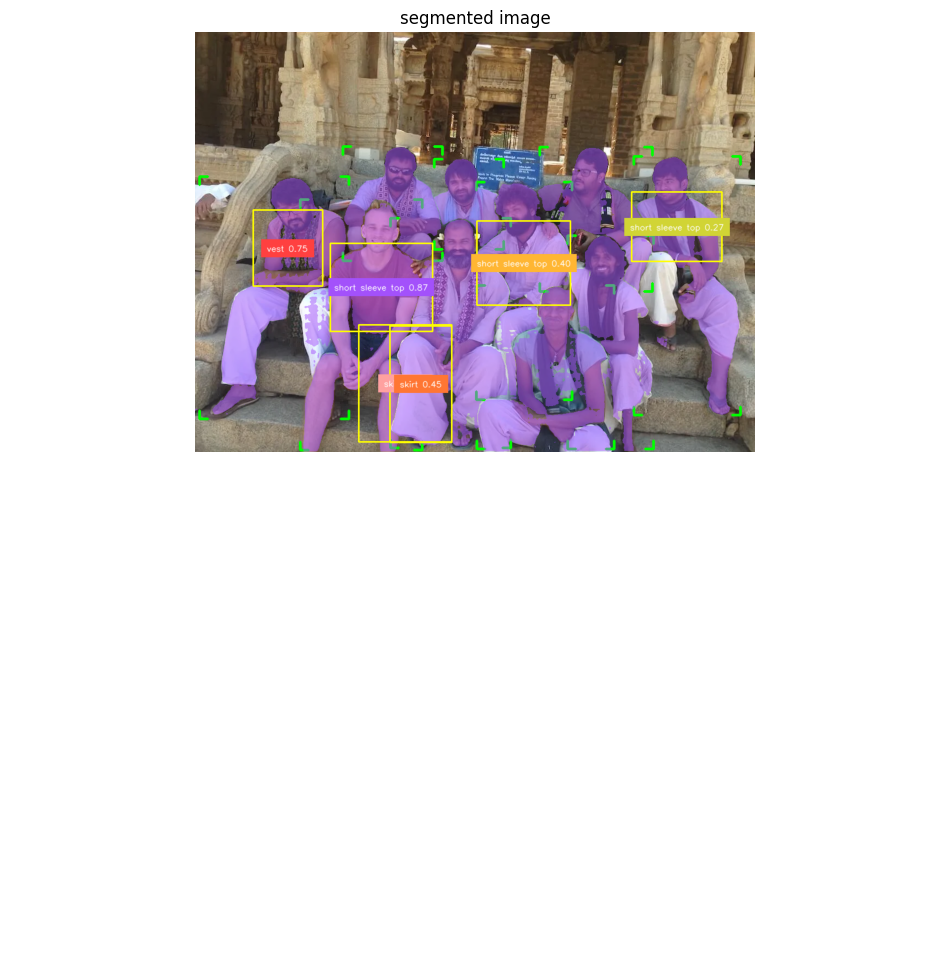

In [17]:
for i, pr in enumerate(pp_results):    
    annotated_image = cv2.imread(pr.path)
    mask_predictor.set_image(annotated_image)
    
    pp_detections = sv.Detections.from_ultralytics(pr)
    pp_detections = pp_detections[pp_detections.class_id == 0]
    annotated_image = corner_annotator.annotate(annotated_image, pp_detections)
    
    for box in pr.boxes:
        input_box = np.array(box.xyxy.tolist()[0])
        masks, _, _ = mask_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=input_box[None, :],
            multimask_output=False,
        )

        pp_detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            class_id=np.array(box.cls.tolist()),
            confidence=np.array(box.conf.tolist())
        ).with_nms(threshold=0.1)
        pp_detections = pp_detections[pp_detections.class_id == 0]
        annotated_image = mask_annotator.annotate(scene=annotated_image, detections=pp_detections)
    
    
    # Fashion
    result = results[i]
    detections = sv.Detections.from_ultralytics(result)
    labels = [f"{result.names[class_id]} {confidence:.2f}" for xy, mask, confidence, class_id, tracker_id, data in detections]

    annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

    sv.plot_images_grid(
        images=[annotated_image],
        grid_size=(2, 1),
        titles=['segmented image']
    )
    
    # Save annotted image
    with sv.ImageSink(target_dir_path='runs/detect/manual/', overwrite=False) as sink:
        sink.save_image(image=annotated_image, image_name=f"test{i}.png")